In [4]:

import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp
from genpen.utils import Paper
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
import vpype
from skimage import io
from pathlib import Path

from sklearn.preprocessing import minmax_scale
from skimage import feature
from skimage import exposure

from skimage import filters
from skimage.color import rgb2gray
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.morphology import disk

def local_angle(dx, dy):
    """Calculate the angles between horizontal and vertical operators."""
    return np.mod(np.arctan2(dy, dx), np.pi)

from PIL import Image


import cv2


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
image_path= '/home/naka/art/wigglesphere.jpg'
filename = 'vp_test3.svg'
paper_size:str = '11x14 inches'
border:float=20  # mm
image_rescale_factor:float=0.04
smooth_disk_size:int=1
hist_clip_limit=0.1
hist_nbins=32
intensity_min=0.
intensity_max=1.
hatch_spacing_min=0.35  # mm
hatch_spacing_max=1.1 # mm
pixel_width=1 # mm
pixel_height=1 # mm
angle_jitter='ss.norm(loc=10, scale=0).rvs'  # degrees
pixel_rotation='0'  # degrees
merge_tolerances=[0.3, 0.4,]  # mm
simplify_tolerances=[0.2,]  # mm
savedir='/home/naka/art/plotter_svgs'

In [174]:
# make page
paper = Paper(paper_size)
drawbox = paper.get_drawbox(border)vector + self.pg.noise(pt.x, pt.y) * self.noise_mult

# load
img =  rgb2gray(io.imread(Path(image_path)))

In [175]:

        
img_rescale = rescale(img, image_rescale_factor)
img_renorm = exposure.equalize_adapthist(img_rescale, clip_limit=hist_clip_limit, nbins=hist_nbins)
# img_renorm = img_rescale

In [176]:
# calc dominant angle
selem = disk(smooth_disk_size)
filt_img = filters.rank.mean(img_renorm, selem)
angle_farid = local_angle(filters.farid_h(filt_img), filters.farid_v(filt_img))

/home/naka/anaconda3/envs/genpen/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [177]:
angle_farid.max()

3.141592653589793

In [184]:
remapped_angle_farid = np.interp(angle_farid, xp=[0, np.pi], fp=[np.pi * 0.25, np.pi * 0.75])

In [185]:
from scipy.ndimage import gaussian_filter

In [186]:
smoothed_angle = gaussian_filter(remapped_angle_farid, sigma=1)

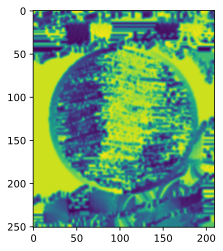

In [187]:
plt.imshow(smoothed_angle)

In [188]:
# make pixel polys
prms = []
for y, row in tqdm(enumerate(img_renorm)):
    for x, intensity in enumerate(row):

        p = gp.centered_box(Point(x, y), width=pixel_width, height=pixel_height)
        a = np.degrees(smoothed_angle[y, x])
        prm = {
            'geometry':p,
            'x':x,
            'y':y,
            'raw_pixel_width':pixel_width,
            'raw_pixel_height':pixel_height,
            'intensity': intensity,
            'angle':a,
            'group': 'raw_hatch_pixel',

        }
        prms.append(prm)
raw_hatch_pixels = geopandas.GeoDataFrame(prms)

251it [00:02, 123.77it/s]


In [189]:
#  rescale polys to fit in drawbox
bbox = box(*raw_hatch_pixels.total_bounds)
_, transform = gp.make_like(bbox, drawbox, return_transform=True)
A = gp.AffineMatrix(**transform)
scaled_hatch_pixels = raw_hatch_pixels.copy()
scaled_hatch_pixels['geometry'] = scaled_hatch_pixels.affine_transform(A.A_flat)
scaled_hatch_pixels['scaled_pixel_height'] = scaled_hatch_pixels['geometry'].apply(gp.get_height)
scaled_hatch_pixels['scaled_pixel_width'] = scaled_hatch_pixels['geometry'].apply(gp.get_width)

In [190]:
scaled_hatch_pixels['angle'] = scaled_hatch_pixels['angle'] // 15 * 15

In [191]:
# scaled_hatch_pixels['angle'] = np.interp(scaled_hatch_pixels['angle'], xp=[0, 180], fp=[30, 150])

In [192]:
new_drawbox = so.unary_union(scaled_hatch_pixels.geometry)
db = gp.Poly(new_drawbox)

In [193]:
qpg = QuantizedPiecewiseGrid(scaled_hatch_pixels, xstep=5, ystep=5)
qpg.make_grid()

48it [04:08,  5.17s/it]


In [216]:
# # evenly spaced grid
# bins, grid = gp.overlay_grid(new_drawbox, xstep=2.5, ystep=2.5, flatmesh=True)
# xs, ys = grid
# pts = [Point(x,y) for x,y in zip(xs, ys)]

# # random
# pts = gp.get_random_points_in_polygon(new_drawbox, 4000)

n_points = 5000
pts = []
pix_p =  np.interp(scaled_hatch_pixels['intensity'], [0, 1], [0.9, 0.1])
pix_p /= pix_p.sum()
for ii in range(n_points):
    pix = np.random.choice(scaled_hatch_pixels.index, p=pix_p)
    pt = gp.get_random_point_in_polygon(scaled_hatch_pixels.loc[pix, 'geometry'])
    pts.append(pt)

# # circle    
# rad = 50
# n_points = 100
# circ = new_drawbox.centroid.buffer(rad).boundary
# pts = [circ.interpolate(d, normalized=True) for d in np.linspace(0, 1, n_points)]

In [217]:
vps = []
for p in pts:
    vp = VectorParticle(pos=p, vector=np.array([0, 1]), grid = qpg, stepsize=1)
    vp.momentum_factor = np.interp(vp.y, [db.bottom, db.top], [2, 2])
    vps.append(vp)

In [218]:
for vp in tqdm(vps):
    for ii in range(29):
        vp.momentum_factor = np.interp(vp.y, [db.bottom, db.top], [2, 2])
        vp.step()

100%|██████████| 5000/5000 [00:20<00:00, 248.71it/s]


In [219]:
vps = [vp for vp in vps if len(vp.pts) > 1]

lss = [LineString(vp.pts) for vp in vps]

lss = gp.merge_LineStrings(lss)

# blss = lss.buffer(0.01, join_style=2, cap_style=2).boundary

In [220]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.stroke(1)
sk.geometry(lss)
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-16T18:49:25.048434 
 
 
 
 
 
 <polyline points="873.4385,724.9645 873.4385,728.744 873.4385,732.5235 873.4385,736.303 873.4385,740.0826 873.4385,743.8621 873.7646,747.5987 874.308,751.3067 874.9964,754.9956 875.7814,758.6718 876.6308,762.3395 877.5231,766.0015 878.118,769.7027 879.1445,773.2612 880.4588,776.7247 881.9649,780.1247 883.5988,783.4824 884.6882,786.9807 885.4144,790.5727 885.8985,794.2273 886.2213,797.9235 886.4365,801.6475 886.2538,805.3471 885.806,809.0303 885.1814,812.7028 884.4389,816.368 883.6179,820.0284 882.7444,823.6856 881.8361,827.3406 880.9044,830.9942"/>
 <polyline points="720.6806,915.3891 721.3105,918.9998 722.3603,922.4981 723.6902,925.9213 725.2067,929.2945 726.8476,932.6343 727.9415,936.1207 728.6708,939.7048 729.157,943.3541 729.4811,947.0468 729.6972,950.7684 729.8413,954.5093 730.5672,958.0943 731.6811,961.5754 733.0536,964.9871 734.5986,968.3527 736.2584,971.6875 737.9949,975.0017 739.7825,978.3022 741.6042,981.5937 743.4485,984.879 745.308,988.1603 747.1776,991.4388 748.0979,994.8415 748.3854,998.3268 748.251,1001.8673 747.8353,1005.4445 747.2321,1009.0462 747.4599,1012.5385 748.2417,1015.9577"/>
 <polyline points="523.9015,521.2848 523.2716,524.8956 522.2217,528.3938 520.8919,531.817 519.3754,535.1902 517.7345,538.53 516.3145,541.9735 515.0418,545.4861 513.8672,549.0447 512.7581,552.634 511.6926,556.2438 510.6562,559.8673 509.6392,563.4998 508.6351,567.1384 507.6397,570.7811 506.65,574.4265 505.3602,577.9477 503.8705,581.3863 502.2474,584.7698 500.5355,588.1165 498.7642,591.4386 497.2573,594.8703 495.6228,598.2492 493.9032,601.5928 492.1269,604.913 490.3127,608.2174 488.4734,611.5115 486.6172,614.7986 484.7499,618.081 482.8751,621.3604"/>
 <polyline points="912.2075,1058.9327 913.0983,1062.3432 914.5831,1065.5077 916.4637,1068.5082 918.0436,1071.7255 919.4229,1075.0873 920.6685,1078.5454 921.825,1082.0677 922.922,1085.6328 924.2833,1089.1006 925.8208,1092.5035 927.4757,1095.8632 929.2088,1099.194 930.9942,1102.5056 932.8144,1105.8044 934.6578,1109.0947 936.2127,1112.5051 937.5755,1115.9956 938.81,1119.5395 939.9591,1123.1191 940.3991,1126.7224 940.3664,1130.3415 940.0185,1133.9711 939.4605,1137.6078 938.7624,1141.2491 938.297,1144.9366 937.9868,1148.6547 937.78,1152.3933 937.6421,1156.1455 937.5501,1159.9068"/>
 <polyline points="302.1212,433.1452 303.012,436.5557 304.4968,439.7203 306.3775,442.7208 308.2612,445.8122 310.1469,448.9642 312.0339,452.1566 314.1828,455.1757 316.5063,458.0792 318.9461,460.9058 321.2025,463.8812 323.3368,466.9559 325.3895,470.0968 327.3879,473.2817 329.3501,476.4961 331.2882,479.73 333.471,482.7768 335.8171,485.6989 338.272,488.5378 340.7995,491.3212 343.3753,494.0677 345.9833,496.7895 348.6129,499.4949 351.2568,502.1893 353.9102,504.8764 356.57,507.5587 359.234,510.2377 361.9009,512.9146 364.5696,515.59 367.2396,518.2644"/>
 <polyline points="733.6169,498.537 733.2908,502.2736 732.7474,505.9816 732.059,509.6705 731.274,513.3467 730.4246,517.0144 730.1844,520.6764 730.3504,524.3347 730.7871,527.9905 731.4043,531.6445 732.1418,535.2975 732.9596,538.9498 733.8308,542.6015 734.7377,546.2529 735.6684,549.9041 736.6149,553.5551 737.572,557.2061 738.5361,560.8569 739.5049,564.5078 740.4769,568.1586 741.4509,571.8093 742.4264,575.4601 743.0767,579.1538 743.5102,582.8761 743.7992,586.6175 743.9919,590.3716 744.1203,594.1341 744.532,597.8594 745.1326,601.5599 745.859,605.2438"/>
 <polyline points="402.8451,415.047 403.475,418.6577 404.5249,422.1559 405.8547,425.5791 407.3712,428.9523 409.0121,432.2922 410.7359,435.6098 412.5151,438.9126 414.3311,442.2055 415.5418,445.6607 416.3489,449.2239 416.887,452.8593 417.2457,456.5427 417.4849,460.2581 417.9704,463.952 418.6201,467.6315 419.3794,471.3014 420.2116,474.9649 421.0925,478.6242 422.0058,482.2806 421.9848,485.8093 421.3408,489.2528 420.2816,492.6395 418.9455,495.9884 417.4249,499.312 417.0411,502.6188 417.4151,505.9144 418.2944,509.2026 419.5105,512

In [169]:
merge_tolerances = [0.2, 0.3, 0.4, 0.5, 0.6]
simplify_tolerances = [0.2]

In [170]:
# sk.vpype('splitall')
        
    
for tolerance in tqdm(merge_tolerances):
    sk.vpype(f'linemerge --tolerance {tolerance}mm')

for tolerance in tqdm(simplify_tolerances):
    sk.vpype(f'linesimplify --tolerance {tolerance}mm')

sk.vpype('linesort')
sk.display()

100%|██████████| 1/1 [00:00<00:00,  3.53it/s]


<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-16T11:06:08.741629 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 

In [172]:
savepath = Path(savedir).joinpath(filename).as_posix()
sk.save(savepath)

# w subdivide

In [12]:
image_path= '/home/naka/art/wigglesphere.jpg'
filename = 'vp_test12.svg'
paper_size:str = '11x14 inches'
border:float=20  # mm
image_rescale_factor:float=0.04
smooth_disk_size:int=1
hist_clip_limit=0.1
hist_nbins=32
intensity_min=0.
intensity_max=1.
hatch_spacing_min=0.35  # mm
hatch_spacing_max=1.1 # mm
pixel_width=1 # mm
pixel_height=1 # mm
angle_jitter='ss.norm(loc=10, scale=0).rvs'  # degrees
pixel_rotation='0'  # degrees
merge_tolerances=[0.3, 0.4,]  # mm
simplify_tolerances=[0.2,]  # mm
savedir='/home/naka/art/plotter_svgs'

In [13]:
# make page
paper = Paper(paper_size)
drawbox = paper.get_drawbox(border)

# load
img =  rgb2gray(io.imread(Path(image_path)))

In [16]:
xgen = ss.uniform(loc=0.45, scale=0.0).rvs
split_func = functools.partial(gp.split_along_longest_side_of_min_rectangle, xgen=xgen)
splits = gp.recursive_split_frac_buffer(
    drawbox, 
    split_func=split_func,
    p_continue=0.8, 
    depth=0, 
    depth_limit=3,
    buffer_frac=-0.0
)
# split_func = functools.partial(gp.random_bezier_subdivide, x0=0.19, x1=0.85, n_eval_points=50)
# splits = gp.recursive_split_frac_buffer(
#     drawbox, 
#     split_func=split_func,
#     p_continue=0.7, 
#     depth=0, 
#     depth_limit=8,
#     buffer_frac=-0.0
# )


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-21T16:18:04.124806

In [17]:
# make pixel polys
prms = []
for bp in tqdm(bps):

    a = np.random.uniform(0, 240)
    prm = {
        'geometry':bp,
        'raw_pixel_width':pixel_width,
        'raw_pixel_height':pixel_height,
        'angle':a,
        'group': 'raw_hatch_pixel',
        'intensity': 1,

    }
    prms.append(prm)
raw_hatch_pixels = geopandas.GeoDataFrame(prms)

100%|██████████| 14/14 [00:00<00:00, 97380.19it/s]


In [18]:
#  rescale polys to fit in drawbox
bbox = box(*raw_hatch_pixels.total_bounds)
_, transform = gp.make_like(bbox, drawbox, return_transform=True)
A = gp.AffineMatrix(**transform)
scaled_hatch_pixels = raw_hatch_pixels.copy()
scaled_hatch_pixels['geometry'] = scaled_hatch_pixels.affine_transform(A.A_flat)
scaled_hatch_pixels['scaled_pixel_height'] = scaled_hatch_pixels['geometry'].apply(gp.get_height)
scaled_hatch_pixels['scaled_pixel_width'] = scaled_hatch_pixels['geometry'].apply(gp.get_width)

In [19]:
new_drawbox = so.unary_union(scaled_hatch_pixels.geometry)
db = gp.Poly(new_drawbox)

In [20]:
scaled_hatch_pixels['angle'] = np.interp(scaled_hatch_pixels.geometry.centroid.y, [db.bottom, db.top], [0, 680]) + np.random.randn(len(scaled_hatch_pixels)) * 5

In [21]:
scaled_hatch_pixels['angle'] = scaled_hatch_pixels['angle'] // 5 * 5

In [69]:
# scaled_hatch_pixels['angle'] = np.interp(scaled_hatch_pixels['angle'], xp=[0, 180], fp=[30, 150])

In [158]:
qpg = NoisyQuantizedPiecewiseGrid(scaled_hatch_pixels, xstep=5, ystep=5, noise_scale=0.0001, noise_mult=1, verbose=True)

qpg.make_grid()

# qpg = QuantizedPiecewiseGrid(scaled_hatch_pixels, xstep=5, ystep=5)
# qpg.make_grid()

48it [00:00, 71.97it/s]


In [26]:
# # evenly spaced grid
# bins, grid = gp.overlay_grid(new_drawbox, xstep=2.5, ystep=2.5, flatmesh=True)
# xs, ys = grid
# pts = [Point(x,y) for x,y in zip(xs, ys)]

# # random
# pts = gp.get_random_points_in_polygon(new_drawbox, 4000)

# n_points = 5000
# pts = []
# pix_p =  np.interp(scaled_hatch_pixels['intensity'], [0, 1], [0.9, 0.1])
# pix_p /= pix_p.sum()
# for ii in range(n_points):
#     pix = np.random.choice(scaled_hatch_pixels.index, p=pix_p)
#     pt = gp.get_random_point_in_polygon(scaled_hatch_pixels.loc[pix, 'geometry'])
#     pts.append(pt)

# # circle    
# rad = 50
# n_points = 100
# circ = new_drawbox.centroid.buffer(rad).boundary
# pts = [circ.interpolate(d, normalized=True) for d in np.linspace(0, 1, n_points)]

In [70]:
def get_random_line_in_polygon(polygon, max_dist=None, min_dist=None):
    pt0 = gp.get_random_point_in_polygon(polygon)
    pt1 = gp.get_random_point_in_polygon(polygon)
    
    if max_dist is not None:
        while pt0.distance(pt1) > max_dist:
            pt1 = gp.get_random_point_in_polygon(polygon)
            
    if min_dist is not None:
        while pt0.distance(pt1) < min_dist:
            pt1 = gp.get_random_point_in_polygon(polygon)
    
    return LineString([pt0, pt1])

In [198]:
qpg = NoisyQuantizedPiecewiseGrid(scaled_hatch_pixels, xstep=5, ystep=5, noise_scale=0.1, noise_mult=0.8, verbose=False)
qpg.make_grid()

48it [00:00, 74.53it/s]


In [205]:
poly = new_drawbox
pts = []
lss = []
n_lines = 900
for ii in tqdm(range(n_lines)):
    ls = get_random_line_in_polygon(poly, min_dist = 10, max_dist=400)
    new_pts = [ls.interpolate(d) for d in np.linspace(0, ls.length, np.random.randint(1,32))]
    vps = [VectorParticle(pos=pt, vector=np.random.uniform(-1,1,size=2), grid=qpg, stepsize=1, momentum_factor=np.random.uniform(0,0)) for pt in new_pts]
    for vp in vps:
        for ii in range(10):
            vp.step()
    vps = [vp for vp in vps if len(vp.pts) > 1]
    ls = gp.merge_LineStrings([LineString(vp.pts) for vp in vps])
    lss.append(ls)

100%|██████████| 900/900 [00:40<00:00, 21.97it/s]


In [206]:
blss = gp.merge_LineStrings(lss).buffer(0.1, cap_style=2, join_style=2)

In [209]:
poly = new_drawbox
pts = []
lss = []
n_lines = 900
for ii in tqdm(range(n_lines)):
    ls = get_random_line_in_polygon(poly, min_dist = 10, max_dist=400)
    new_pts = [ls.interpolate(d) for d in np.linspace(0, ls.length, np.random.randint(1,32))]
    vps = [VectorParticle(pos=pt, vector=np.random.uniform(-1,1,size=2), grid=qpg, stepsize=1, momentum_factor=np.random.uniform(0,0)) for pt in new_pts]
    for vp in vps:
        for ii in range(10):
            vp.step()
    vps = [vp for vp in vps if len(vp.pts) > 1]
    ls = gp.merge_LineStrings([LineString(vp.pts) for vp in vps])
    lss.append(ls)

100%|██████████| 900/900 [00:41<00:00, 21.73it/s]


In [210]:
blss2 = gp.merge_LineStrings(lss).buffer(0.1, cap_style=2, join_style=2)

In [211]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
# for ii, ls in enumerate(lss):
#     sk.stroke(ii + 1)
#     sk.geometry(ls)
sk.stroke(1)
sk.geometry(blss)
sk.stroke(2)
sk.geometry(blss2)
    
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-21T17:12:33.966863 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="961.1049,142.6747 962.2644,146.3 963.5286,149.8615 964.9393,153.3264 966.1596,156.8611 967.041,160.512 967.8428,164.1952 968.6344,167.8747 968.9908,170.0607 968.9532,170.07 969.0693,170.5423 969.2411,171.5965 969.7217,173.1963 969.8565,173.7449 970.8687,177.3779 971.6088,181.0454 972.0516,184.7307 972.3982,188.4209 972.717,192.1068 972.922,195.7674 972.9831,199.3705 972.5629,202.7075 971.6558,205.5306 972.3755,205.7619 973.3041,202.8718 973.7398,199.4116 973.6776,195.7399 973.4711,192.0531 973.1511,188.353 972.8033,184.6503 972.3558,180.9254 971.6042,177.2014 971.0013,175.0376 971.0588,175.0204 970.4511,172.9973 969.8105,170.391 969.3774,167.7343 968.5816,164.0353 967.7778,160.3428 966.8859,156.6486 965.6472,153.0603 964.2352,149.5924 962.9807,146.0583 961.8407,142.4941 961.2017,138.8147 960.4569,138.9441"/>
 
 <polygon points="945.1967,1237.019 943.4667,1236.3327 940.1819,1234.9958 936.9086,1233.6208 933.6596,1231.9684 930.3926,1230.3424 930.0558,1231.0191 933.3199,1232.6437 936.5904,1234.3071 939.8931,1235.6944 943.1848,1237.0341 946.4625,1238.3343 949.7221,1239.8818 952.985,1241.5469 956.3074,1243.0269 959.556,1243.865 962.6618,1244.4296 962.6902,1244.2735 964.2986,1244.5039 966.9757,1244.5201 969.1632,1244.2813 971.2359,1244.0185 973.5001,1243.8256 973.436,1243.0724 971.1562,1243.2666 969.0747,1243.5306 966.9368,1243.7639 964.3547,1243.7483 961.3769,1243.3218 958.2711,1242.67 955.048,1241.5848 951.8083,1239.9511 948.5292,1238.3355 945.2316,1236.9367"/>
 
 
 
 
 <polygon points="836.2086,360.176 835.777,360.7323 834.8227,361.9984 833.8395,363.324 832.8204,364.7342 833.433,365.1769 834.4494,363.7705 835.4281,362.451 836.3775,361.1915 837.2484,360.069 838.0004,359.1101 838.6569,358.2569 839.0278,357.7688 841.4612,360.0077 843.9431,362.7788 845.7867,365.9532 846.2096,365.7076 847.6259,367.877 849.751,370.985 851.9433,374.0366 853.9026,377.2091 856.1073,380.3182 858.8357,382.9466 859.3601,382.4022 856.6828,379.823 854.5331,376.7915 852.5726,373.6169 850.37,370.5511 848.2544,367.457 846.2101,364.3256 844.1761,361.1386 841.4591,358.4755 839.9839,357.0929 840.4737,356.4668 840.6907,356.1897 840.8305,356.3224 843.6265,358.7786 846.271,361.3845 848.4049,364.4438 850.6195,367.4781 852.5384,370.6473 854.4161,373.8483 856.3284,377.0867 858.9813,379.8244 859.5242,379.2984 856.9336,376.6251 855.0676,373.4649 853.1877,370.2603 851.2492,367.0588 849.0203,364.0048 848.6011,363.4038 850.939,366.2925 852.9513,369.4182 854.9,372.5904 856.8484,375.8124 859.5054,378.543 860.0471,378.0159 857.4505,375.3472 855.5455,372.197 853.5912,369.0157 851.5523,365.8488 851.2653,365.4942 851.3024,365.4639 850.4991,364.4792 850.8611,364.184 851.1469,364.5249 853.4355,367.5062 855.5847,370.5828 857.744,373.6634 857.865,373.5786 859.9674,375.81 862.8657,378.1419 865.7679,380.3692 865.8769,380.4656 862.9715,378.2762 860.0964,375.9769 859.6243,376.5673 862.5079,378.8734 865.4232,381.0703 868.2022,383.4795 870.6184,386.342 873.0079,389.3014 875.808,391.8466 878.7793,394.0627 881.8576,395.5583 884.7739,396.525 887.7213,397.6344 887.9876,396.9269 885.0261,395.8123 882.1429,394.8565 879.1739,393.414 876.2894,391.2626 873.5595,388.7812 873.3795,388.5583 873.6449,388.349 875.399,390.2745 875.9578,389.7654 873.4257,386.9858 871.1249,383.9997 868.6382,381.0972 865.7517,378.723 862.8646,376.4782 863.232,376.0341 860.3984,373.6903 857.8558,370.9651 855.6232,367.9506 853.3388,364.9297 850.8701,362.0637 848.5222,359.0768 845.7425,356.5213 842.9282,354.0762 840.7658,352.2329 841.0492,351.8719 841.6394,351.1024 841.9033,351.3297 844.8448,353.4882 847.6917,355.8246 850.4821,358.245 853.0242,361.013 855.6376,363.7152 858.0649,366.612 860.6997,369.3407 863.467,371.8717 863.9771,371.3139 861.2271,368.7987 858.6272,366.1061 856.1996,363.209 853.5743,360.4945 851.0098,357.7021 848.1792,355.2469 845.3085,352

In [393]:
merge_tolerances = [0.2, 0.3, 0.4, 0.5, 1]
simplify_tolerances = [0.2]

In [394]:
sk.vpype('splitall')
        
    
for tolerance in tqdm(merge_tolerances):
    sk.vpype(f'linemerge --tolerance {tolerance}mm')

for tolerance in tqdm(simplify_tolerances):
    sk.vpype(f'linesimplify --tolerance {tolerance}mm')

sk.vpype('linesort')
sk.display()

100%|██████████| 1/1 [00:00<00:00, 19.22it/s]


<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-16T23:58:01.295536 
 
 
 
 
 
 
 
 <polyline points="418.6766,988.053 402.3107,978.6041 384.939,964.0275 361.3119,830.0316 355.6426,820.2121 354.7618,821.0286 360.4311,830.8481 384.0582,964.844 401.4299,979.4206 418.2732,989.2096 401.9073,979.7608 381.6403,962.7547 358.6695,832.481 353.0002,822.6615 353.881,821.845 359.5503,831.6645 383.1774,965.6604 400.5491,980.237 416.915,989.6858 415.781,991.0146 402.6884,983.4556 379.5261,964.0201 355.899,830.0242 352.1195,823.4779 351.2387,824.2943 355.0182,830.8407 378.6453,964.8366 401.8076,984.272 415.3776,992.1713 402.285,984.6122 376.2274,962.7473 353.2566,832.4735 349.4771,825.9272 348.5963,826.7436 350.4861,830.0168 374.1132,964.0127 400.1707,985.8776 413.2634,993.4367 414.0195,992.6475 400.9268,985.0885 377.7645,965.653 354.1374,831.6571 350.3579,825.1108"/>
 <polyline points="345.9539,829.1929 347.8437,832.4661 370.8145,962.7399 402.6626,989.4637 412.4821,995.133 402.1852,989.1235 373.2324,964.8291 349.6053,830.8332 347.7155,827.5601 346.8347,828.3765 348.7245,831.6497 372.3516,965.6456 401.3044,989.9399 411.1239,995.6092 410.3679,996.3983 400.5484,990.729 368.7002,964.0053 345.0731,830.0094 344.1923,830.8258 367.8194,964.8217 402.5629,993.9749 409.9645,997.555 400.145,991.8857 365.4016,962.7325 342.4308,832.4587 343.3116,831.6423 366.9386,965.6381 401.6821,994.7914 408.7058,998.9111 402.1595,995.1316 364.5208,963.5489 341.55,833.2751 338.9076,835.7244 361.2221,962.2761 401.7561,996.2882 408.3024,1000.0677 401.2787,995.948 363.64,964.3654 340.6692,834.0916 339.7884,834.908 362.7592,965.1818 400.3979,996.7644 407.4216,1000.8842 400.8753,997.1046 360.3413,963.0926 338.0268,836.5409"/>
 <polyline points="356.5234,819.3957 364.0825,832.4884 387.0532,962.7622 401.5297,974.9093 421.1687,986.2479 401.177,974.5418 386.7006,962.3947 363.0735,828.3988 357.4042,818.5793 358.285,817.7628 363.9543,827.5823 388.2377,965.3003 402.7141,977.4475 419.0799,986.8963 402.3614,977.08 387.885,964.9328 362.9453,823.4927 359.1658,816.9464 360.0466,816.13 363.8261,822.6763 388.7658,964.1164 400.3469,973.8341 419.9859,985.1727 402.8896,975.8961 388.4131,963.7489 362.8171,818.5867 360.9274,815.3135 361.8081,814.4971 363.6979,817.7703 389.2939,962.9325 400.8751,972.6502 420.5141,983.9888 400.5224,972.2827 388.9413,962.565 362.6889,813.6807 363.5697,812.8642 390.4784,965.4706 402.0595,975.1884 418.4253,984.6372 419.3061,983.8208 402.9403,974.3719 391.3591,964.6542 364.4505,812.0478 365.3313,811.2313 392.2399,963.8378 400.9258,971.1261 420.5648,982.4647 421.3209,981.6755 401.6819,970.3369 395.8913,965.4781 368.9827,812.8716 367.0929,809.5985 367.9737,808.782 369.8634,812.0552 396.7721,964.6616 402.5626,969.5205 423.0569,980.6596 400.1448,967.4313 394.3542,962.5724 368.1019,813.6881 366.2121,810.4149"/>
 <polyline points="374.1392,803.067 379.8085,812.8865 402.7793,943.1603 442.0573,965.8374 442.6595,965.0317 409.9279,946.134 386.3008,812.1381 377.6624,799.8012 376.7816,800.6177 384.8803,813.3325 407.8511,943.6062 443.8559,964.3936 410.8086,945.3176 387.1815,811.3217 382.3227,805.5311 378.5432,798.9848 379.4239,798.1684 391.0314,813.0227 414.0022,943.2964 446.7339,962.1941 416.4201,945.3857 392.793,811.3898 383.0753,799.8086 381.1855,796.5355 382.0663,795.719 396.6429,813.0908 419.6137,943.3645 449.0722,960.3724 426.2226,946.7162 402.5955,812.7203 385.5895,792.4533 386.4703,791.6369 403.4763,811.9039 427.1034,945.8998 450.0156,959.1281"/>
 <polyline points="444.9978,963.21 415.5393,946.2021 391.9122,812.2062 380.3047,797.3519 382.9471,794.9026 397.5237,812.2743 421.1508,946.2702 447.3361,961.3883 448.2169,960.5719 422.0316,945.4538 398.4045,811.4579 383.8279,794.0862 384.7087,793.2697 401.7147,813.5367 424.6855,943.8105 450.8708,958.9286 427.9842,945.0833 404.3571,811.0874 387.3511,790.8204 388.2318,790.004 407.6673,813.1663 430.6381,943.4401 453.5503,956.6684 437.247,946.7917 413.6199,812.7958 391.755,786.7382 392.6358,785.9218 414.500

In [212]:
savepath = Path(savedir).joinpath(filename).as_posix()
sk.save(savepath)